# 0. PARAMETERS

### 0.1 Packages

In [1]:
#Partie 2
import sumolib
import sys 
import numpy as np

##Partie 3
import xml.etree.ElementTree as ET

#Partie 4
import webbrowser
import os
import time 
from datetime import datetime

### 0.2 Parameters definiton

In [3]:
# 1. OSM data
# 1.1 Query OSM data
counties_name = ["Los Angeles", "Contra Costa"]
path = '/Users/edouardlabarthe/Documents/Edouard/US/Research/CODE/'
output_name = "LA_CS"

network_path = "/Users/edouardlabarthe/Documents/Edouard/US/Research/CODE"
network_file = "LA_CS_network.net.xml"

# 2. FLOW DATA 
network_path = "/Users/edouardlabarthe/Documents/Edouard/US/Research/CODE"


# 1. OSM DATA

### 1.0 Parameters

In [ ]:
#Partie 1
import requests
import json
import os 
import subprocess
import pandas as pd
import overpy
import dicttoxml
import overpass

# 1. OSM data
# 1.1 Query OSM data
counties_name = ["Los Angeles", "Contra Costa"]
path = '/Users/edouardlabarthe/Documents/Edouard/US/Research/CODE/'
output_name = "LA_CS"

# 1.2 Apply NETCOVERT
#network_path = "/Users/edouardlabarthe/Documents/Edouard/US/Research/CODE"
network_file = "LA_CS_network.net.xml"

### 1.1 Query OSM data


https://sumo.dlr.de/docs/Networks/Import/OpenStreetMap.html

Modify the query here: 

In [3]:
# Query OSM data using open street map
def fetch_osm_data(counties, path, output_name):
    overpass_url = "http://overpass-api.de/api/interpreter"

    #Used
    query_bodies = ''
    for idx, county in enumerate(counties):

        overpass_query_body = '''area["county:name"="''' + county + '''"]->.searchArea''' + str(idx) + ''';
                                (
                                    (
                                    node["highway"="motorway"][~"^ref$"~"^I"](area.searchArea''' + str(idx) + ''');  
                                    way["highway"="motorway"][~"^ref$"~"^I"](area.searchArea''' + str(idx) + ''');
                                    )->.a''' + str(idx) + ''';	
                                    (
                                    node(w.a''' + str(idx) + ''')["highway"="motorway_juction"](area.searchArea''' + str(idx) + ''');
                                    way(around.a''' + str(idx) + ''':5)["highway"="motorway_link"](area.searchArea''' + str(idx) + ''');	
                                    );
                                );'''
    
        query_bodies = query_bodies + overpass_query_body

    total_query = '''
                    [out:xml][timeout:1000];
                    ( 
                    ''' + query_bodies + ''' 
                    );
                    out meta;
                    >;
                    out meta; 
                    '''
        
    response = requests.get(overpass_url, params={'data': total_query}, )

    #Write the file
    f = open(path + output_name + '.osm', "w")
    f.write(response.text)
    f.close() 

In [4]:
fetch_osm_data(counties_name, path, output_name)

### 1.2 Go through JOSM for file cleaning 

Manually upload the downloaded OSM data into JOSM software and dowloard the resulting file from JOSM. 

### 1.3. Apply Netconvert

In [ ]:
%cd /Users/edouardlabarthe/Documents/Edouard/US/Research/CODE

!netconvert --osm-files LA_CS_JOSM.osm --o LA_CS_network.net.xml --geometry.remove --ramps.guess --junctions.join --tls.guess-signals --tls.discard-simple --tls.join --tls.default-type actuated

%cd /Users/edouardlabarthe/Documents/Edouard/US/Research/CODE

# 2. FLOW DATA

### 2.0 Parameters

In [84]:
#Partie 2
import os 
import pandas as pd
import sumolib
import sys 
import numpy as np

##Partie 3
import xml.etree.ElementTree as ET
from datetime import datetime


# 2. DETECTOR DATA
# 2.1 Detector
flow_path  = "/Users/edouardlabarthe/Documents/Edouard/US/Research/PeMS/flow_files"
interstates_id = ['5', '80', '10', '580', '105', '680', '110', '210' ,'405', '605', '710']


### 2.1 Retreiving flow informations

In [4]:
def retreive_flow_data(flow_path, interstates_id):

    list_dir = os.listdir(flow_path)

    flow = pd.DataFrame()
    for file in list_dir:

        flow_temp = pd.read_csv(flow_path + "/" + file, sep=",", header=None)
        flow = pd.concat([flow, flow_temp])

    # Build collumns names
    flow_col = ['Timestamp', 'Station', 'District', 'Freeway', 'Direction of Travel', 'Lane Type', 'Station Length', 'Samples', '% Observed', 'Total Flow', 'Avg Occupancy', 'Avg Speed']
    nb_max_lanes = int((flow.shape[1] - 12 )/5)

    for lane in range(nb_max_lanes):
        new_cols = [ 'Lane ' + str(lane) + ' Samples','Lane ' + str(lane) + ' Flow', 'Lane ' + str(lane) + ' Avg Occ', 'Lane ' + str(lane) + ' Avg Speed', 'Lane ' + str(lane) + ' Observed']
        
        for col in new_cols:
            flow_col.append(col)

    # Clean the filter flow table
    flow.columns = flow_col
    flow = flow[flow['Freeway'].isin(interstates_id)]

    return flow

In [28]:
flow = retreive_flow_data(flow_path, interstates_id)

### 2.2 Understanding the data

In [ ]:
# Missing values per variable per type of VDS
flow_col = flow.columns
type_vds = flow["Lane Type"].unique()

inte = flow[flow["Lane Type"].isin(['ML', "OR"])]

for col in flow_col:
    ratio = inte[inte[col].isnull()].shape[0] / flow.shape[0]
    print(col, ratio)

In [7]:
type_vds = flow["Lane Type"].unique()

for type in type_vds:
   ratio = flow[flow["Lane Type"] == type].shape[0] / flow.shape[0]
   print(type, ratio)

ML 0.37786411869659126
OR 0.21583012489435627
FR 0.1610010329608414
HV 0.19142642501643348
FF 0.04437036341440511
CD 0.009507935017372524


### 2.3 Splitting Flow per lane

In [29]:
def flow_by_col(flow):
    # We decided to only take to ML type of detectors
    flow = flow[flow["Lane Type"].isin(['ML'])]
    #flow = flow.sort_values(by = ['Timestamp', 'Station'])

    #MORE CLEVER WITH MISSING VALUES (USE LIST OF )

    # Select only last 12 columns and the flow & speed variable
    flow_lanes = flow.iloc[: , 12:]
    flow_lanes = flow_lanes.iloc[:,[1, 3, 6, 8, 11, 13, 16, 18, 21, 23, 26, 28, 31, 33, 36, 38]]

    # Compute the number of lane per lines using nan values
    lanes = flow_lanes.isnull().sum(axis=1).tolist()
    lanes = [int((16-x)/ 2) for x in lanes]

    # Create list with lane id
    lane_id =[]
    for i in lanes: 
        y = [*range(i)]
        for z in y:
            lane_id.append(z)

    # Add the nb of lanes to the dataframe
    flow['nb_lanes'] = lanes

    # Duplicate each line by the number of max lanes
    flow_dupli = pd.DataFrame(flow.values.repeat(flow.nb_lanes, axis=0), columns=flow.columns) 

    # Clean the flow dupli 
    flow_dupli = flow_dupli.sort_values(by = ['Timestamp', 'Station']).reset_index(drop=True)

    # Initiate new cols
    flow_dupli["lane_id"] = lane_id
    flow_dupli["VDS"] = flow_dupli['Station']

    # Modify VDS name + record the lane flow and speed
    flow_dupli['VDS'] = flow_dupli['Station'].astype(str) + flow_dupli['lane_id'].astype(str)
    

    flows_array = flow_dupli.iloc[: , 12:]
    flows_array = flows_array.iloc[:,[1, 3, 6, 8, 11, 13, 16, 18, 21, 23, 26, 28, 31, 33, 36, 38]].to_numpy()

    speed = []
    flows = []
    for i in range(len(flows_array)):
        x = flows_array[i][lane_id[i]*2]
        y = flows_array[i][lane_id[i]*2+1]
        flows.append(x)
        speed.append(y)

    flow_dupli['flow'] = flows
    flow_dupli['speed'] = speed

    return flow_dupli


In [30]:
flow_dupli = flow_by_col(flow)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


### 2.4 Cleaning and saving the flow file

In [48]:
def flow_preprocessing(flow_dupli): 

   # Format
   fmt ="""%m/%d/%Y %H:%M:%S"""

   # Cleaning the columns and selecting right name
   flow_processed = flow_dupli[["VDS", 'Timestamp', "flow", "speed"]]
   flow_processed.columns = ["Detector", "Time", "qPKW", "vPKW"]
   flow_processed = flow_processed.dropna()

   #Lower bound in time: 
   first_time = datetime.strptime(flow_processed.iloc[0,1], fmt )

   # Compare lowest time to current time for each line in minutes
   flow_processed["Time"] = pd.to_datetime(flow_processed["Time"], format = fmt) 
   flow_processed["Time"] = [(date - first_time).total_seconds() / 60.0 for date in flow_processed["Time"].to_list()]

    # Convert to floats 
   flow_processed = flow_processed.astype(int)

    #Save the file
   flow_processed.to_csv("LA_CS_flow.csv", sep=';', index=False)
   
   return flow_processed


In [50]:
flow_processed = flow_preprocessing(flow_dupli)

01/01/2022 00:00:00
2022-01-01 00:00:00


Final file is : LA_CS_flow.csv

In [76]:
list_detec = flow_processed.Detector.unique()
len(flow_processed.Detector.unique())

4867

In [92]:
flow_processed.Detector.to_list()

[7158980,
 7158981,
 7158982,
 7159180,
 7159181,
 7159182,
 7159200,
 7159201,
 7159202,
 7159203,
 7159290,
 7159291,
 7159292,
 7159293,
 7159300,
 7159301,
 7159302,
 7159303,
 7159330,
 7159331,
 7159332,
 7159333,
 7159380,
 7159381,
 7159382,
 7159383,
 7159440,
 7159441,
 7159442,
 7159443,
 7159470,
 7159471,
 7159472,
 7159960,
 7159961,
 7159962,
 7159963,
 7159964,
 7159965,
 7160070,
 7160071,
 7160072,
 7160073,
 7160074,
 7160100,
 7160101,
 7160102,
 7160103,
 7160160,
 7160161,
 7160162,
 7160163,
 7160170,
 7160171,
 7160172,
 7160173,
 7160230,
 7160231,
 7160232,
 7160233,
 7160280,
 7160281,
 7160282,
 7160320,
 7160321,
 7160322,
 7160323,
 7160360,
 7160361,
 7160362,
 7160363,
 7160364,
 7160470,
 7160471,
 7160472,
 7160473,
 7160500,
 7160501,
 7160502,
 7160503,
 7160570,
 7160571,
 7160572,
 7160573,
 7160630,
 7160631,
 7160632,
 7160633,
 7160670,
 7160671,
 7160672,
 7160690,
 7160691,
 7160692,
 7160693,
 7160720,
 7160721,
 7160722,
 7160723,
 7160724,


In [82]:
#len(detectors_id)
strings = [str(x) for x in detectors_id]
result = [i for i in strings if i.startswith('7')]
len(result)


8800

# 3. DETECTOR DATA

### 3.0 Parameters

In [86]:
# 3.1
detectors_raw_file = "vds_config.xml" # Accessible in PeMS help section
districts_id = ["7", "4"]
counties_id = ["37", "111", "13" ]
interstates_id = ['5', '80', '10', '580', '105', '680', '110', '210' ,'405', '605', '710']

# 3.2
network_file = "LA_CS_network.net.xml"

# 3.4
detector_file_name = "LA_CS_detector.xml"
detectors_output_file = "LA_CS_detector_simulated.xml"

What we do ? 

### 3.1. Retreiving detector informations

In [93]:
def retreive_detectors_data(file_name, districts_id, counties_id, interstates_id):

    # Read the file using ElementTree package
    tree = ET.parse(file_name)

    # getting the parent tag of
    # the xml document
    root = tree.getroot()

    #Initiate the rows
    rows = []

    # Can probably automate cols retreival. 
    df_cols = ['id', "name", 'type', 'county_id', 'city_id', 'freeway_id', 'freeway_dir', 'lanes', 'cal_pm', 'abs_pm', 'latitude', 'longitude', 'last_modified']

    # Iterate on the districts and only take those who are intersting
    for disctrict in root: 
        if disctrict.attrib.get("id") in districts_id:

            for vds in disctrict[1]:

                res = []
                res.append(vds.attrib.get(df_cols[0]))
                for el in df_cols[1:]:
                    res.append(vds.attrib.get(el) )

                rows.append({df_cols[i]: res[i] 
                            for i, _ in enumerate(df_cols)})
                
    out_df = pd.DataFrame(rows, columns=df_cols)

    out_df = out_df[out_df['county_id'].isin(counties_id)]
    out_df = out_df[out_df['freeway_id'].isin(interstates_id)]

    df_inductor = out_df[["id", "latitude", "longitude"]]
    df_inductor.columns = ["VDS", "lat", "lon"]
    df_inductor["VDS"] = pd.to_numeric(df_inductor["VDS"])
    df_inductor["lat"] = pd.to_numeric(df_inductor["lat"], downcast="float")
    df_inductor["lon"] = pd.to_numeric(df_inductor["lon"], downcast="float")

    df_inductor_array = df_inductor.to_numpy()

    return(out_df, df_inductor_array)

In [94]:
df_inductor, df_inductor_array = retreive_detectors_data(detectors_raw_file, districts_id, counties_id, interstates_id)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

### 3.2 Creation of the detector file

In [64]:
def create_detectors(network_file, df_inductor_array, detectors_output_file):
   
    sys.path.append(os.path.join(os.environ["SUMO_HOME"], 'tools'))

    # Import network and define list
    net = sumolib.net.readNet(network_file)
    detectors = []
    detectors_array = []

    i = 0
    #Loop for every detector
    for id, lon, lat in df_inductor_array:
        xy_pos = net.convertLonLat2XY(lat, lon)
        
        # look 10m around the position
        lanes = net.getNeighboringLanes(xy_pos[0], xy_pos[1], 1000)
        i = i+1
        
        # attention, result is unsorted
        bestLane = None
        ref_d = 9999.

        for lane, dist in lanes:
            # now process them and determine a "bestLane"
            # ...
            if dist < ref_d:
                ref_d = dist
                bestLane = lane

            pos, d = bestLane.getClosestLanePosAndDist(xy_pos)
            freq=300.00
            file = detectors_output_file
        
        if bestLane != None:
            id_bestLane = bestLane.getID()
        else:
            id_bestLane = "00_0"

        #Save information to use in the lane duplication process
        detector = [int(id), id_bestLane, pos, freq, file]
        detectors_array.append(detector)
        
    return detectors_array

### 3.3 Duplicate detectors for every lane

In [65]:
def additional_detectors(detectors_array,df_inductor, detectors_output_file):

    #Add the lane information with df_lane
    detector_df = pd.DataFrame(detectors_array, columns = ["VDS",'lane','position', "freq", "file"])

    df_lane = df_inductor[["id", 'lanes']]
    df_lane.columns = ["VDS", '# Lane Points']
    df_lane["VDS"] = pd.to_numeric(df_lane["VDS"])

    
    detector_df_lane = detector_df.merge(df_lane, how="inner", on= 'VDS').drop_duplicates()

    # Count the nb of time the is an error
    error = 0

    # Loop through the old detectors
    for i in range(detector_df_lane.shape[0]):
        
        #Number of lane at this moment in the road
        total_lane = int(detector_df_lane['# Lane Points'].iloc[i])  
        
        #Current lane positon on the detector
        lane_nb = int(detector_df_lane['lane'].iloc[i][-1])
        
        #List of all other lanes
        list_lane = [*range(total_lane)]
        if lane_nb != total_lane and lane_nb < total_lane:
            list_lane.remove(lane_nb)
            error = error+1

        #For empty lane, add a detector
        for y in list_lane:
            id = str(detector_df_lane['VDS'].iloc[i]) + str(y)
            lane = detector_df_lane['lane'].iloc[i][:-1] + str(y)
            positon = detector_df_lane['position'].iloc[i]
            freq = 300.00
            file = detectors_output_file
            
            detector = [int(id), lane, positon, freq, file]
            detectors_array.append(detector)

    return detectors_array, error
        

### 3.4 Save it in a detector.xml file

In [66]:
def write_additional_file (network_file, df_inductor, df_inductor_array, detector_file_name, detectors_output_file):

    old_detectors = create_detectors(network_file, df_inductor_array, detectors_output_file)
    #print(old_detectors)
    total_detectors, error = additional_detectors(old_detectors, df_inductor, detectors_output_file)

    detectors = []
    detectors_id = []

    for i in total_detectors:

        #Save information in detctor.xml
        detectors_id.append(i[0])
        detectors.append(sumolib.sensors.inductive_loop.InductiveLoop((i[0]), i[1], i[2], i[3], i[4]))
        sumolib.files.additional.write(detector_file_name, detectors)

    return detectors_id

In [67]:
detectors_id = write_additional_file(network_file, df_inductor, df_inductor_array, detector_file_name)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


File finished: LA_CS_detector_processed.xml

# 4. BUILD ROUTES & CALIBRATION

### 4.1 Create route file

#### 4.1.A. DFROUTER

In [ ]:
#dfrouter -n interstate_10.net.xml -d detector2.xml -o routes_dfrouter.rou.xml --emitters-output vehicles_dfrouter.rou.xml --measure-files flow.csv

#### 4.1.B. FLOWROUTER.PY

--revalidate-detectors: disregards the source and sink information

In [2]:
# New cd is used
%cd /Users/edouardlabarthe/sumo/tools/detector

#!python3 flowrouter.py -n LA_CS_network.net.xml -d LA_CS_detector_processed.xml -f LA_CS_flow.csv -o LA_CS_flowrouter.xml -e LA_CS_flows.xml -i 300 --revalidate-detectors -v --debug

flow = open("LA_CS_flows.xml", "rt")
rout = open("LA_CS_flowrouter.xml", "rt")
route = open("LA_CS_flowrouter_clean.xml", "w")

lines_flow = flow.readlines()
lines_rout = rout.readlines()

end_rout = lines_rout[:1]
lines_flow = lines_flow[1:-1]
lines_rout = lines_rout[:-1]

lines_rout.extend(lines_flow)
lines_rout.extend(end_rout)

route.writelines(lines_rout)

flow.close()
rout.close()
route.close()

# Back to the old repo 
%cd /Users/edouardlabarthe/documents/edouard/US/research/CODE

/Users/edouardlabarthe/sumo/tools/detector
/Users/edouardlabarthe/Documents/Edouard/US/Research/CODE


#### 4.2 ASSECEMENT OF ROUTING (flowfromroute.py)

https://sumo.dlr.de/docs/Tutorials/HighwayDetector.html#comparison_of_the_detected_and_the_estimated_flows

https://sumo.dlr.de/docs/Tools/Detector.html

In [ ]:
def performance():
    %cd /Users/edouardlabarthe/sumo/tools/detector

    cmd = "python3 flowFromRoutes.py -d detector_simulated.xml -r routes_flowrouter.xml -e flows.xml -f flow.csv "

    results = !python3 flowFromRoutes.py -d detector.xml -r routes_flowrouter.xml -e flows.xml -f flow.csv

    col = results[-2].split(";")
    val = results[-1].split(";")

    df_results = pd.DataFrame(val, index = col).T

    %cd /Users/edouardlabarthe/documents/edouard/US/research/CODE

    return df_results

# 5. RUN SIMULATION

### 5.1 WRITE THE CONFIG FILE

CONFIG FILE:

https://sumo.dlr.de/xsd/sumoConfiguration.xsd

- SSM

    - Standard devide equipement procedures (https://sumo.dlr.de/docs/Definition_of_Vehicles%2C_Vehicle_Types%2C_and_Routes.html#devices)

      -  </ssm_device>
      -  <device.ssm.probability type="floatOptionType"/>

       - <device.ssm.explicit" type="strArrayOptionType" minOccurs="0"/>

       - <device.ssm.deterministic" type="boolOptionType" minOccurs="0"/>

    - SSM Parameters (https://sumo.dlr.de/docs/Simulation/Output/SSM_Device.html)

      -  <device.ssm.measures" type="strOptionType" minOccurs="0"/>

      -  <device.ssm.thresholds" type="strOptionType" minOccurs="0"/>

      -  <device.ssm.trajectories" type="boolOptionType" minOccurs="0"/>

      -  <device.ssm.range" type="floatOptionType" minOccurs="0"/>

      -  <device.ssm.extratime" type="floatOptionType" minOccurs="0"/>

      -  <device.ssm.file" type="strOptionType" minOccurs="0"/>

      -  <device.ssm.geo" type="boolOptionType" minOccurs="0"/>

      -  <device.ssm.write-positions" type="boolOptionType" minOccurs="0"/>

       - <device.ssm.write-lane-positions" type="boolOptionType" minOccurs="0"/>

      -  </ssm_device>

    - SSM output

      -  <device.ssm.filter-edges.input-file" type="fileOptionType" minOccurs="0"/>


- LANE CHANGE 

  -  <lanechange-output" type="fileOptionType" minOccurs="0"/>

  -  <lanechange-output.started" type="boolOptionType" minOccurs="0"/>

  -  <lanechange-output.ended" type="boolOptionType" minOccurs="0"/>

   - <lanechange-output.xy" type="boolOptionType" minOccurs="0"/>

- COLLISIONS:

    - Output

       - <collision-output type="fileOptionType" minOccurs="0"/>

    - Processing

        - <collision.action" type="strOptionType" minOccurs="0"/>

        - <collision.stoptime" type="timeOptionType" minOccurs="0"/>

        - <collision.check-junctions" type="boolOptionType" minOccurs="0"/>

       - <collision.check-junctions.mingap" type="floatOptionType" minOccurs="0"/>
        
       -  <collision.mingap-factor" type="floatOptionType" minOccurs="0"/>




- REAR END DECELERATION

    - Lead vehicle decelaration
        speed delta / time-span delta 

    - Relative deceleration needed to avoid contact (speed + distance)
        DRAC

- REAR END STOPPED

    - Lead vehicle speed = 0 (close to zero)
        speed += 0
        
    - Relative deceleration needed to avoid contact (speed+distance)
        DRAC

- CHANGING LANE

    - Norm of the lateral and horizontal distance
        space gap = (distance + nb lane*lane Width)
        
    - Relative deceleration needed to avoid contact (speed + distance)
        DRAC (only looks at one way) :  DRAC = 0.5*speed_difference^2/space_gap.

        


In [2]:
def write_config_file(start, duration, element): 

    confi_file_name = "flowrouter.sumocfg"

    #Input
    netwo_file_name = "LA_CS_network.net.xml"
    route_file_name = "LA_CS_flowrouter_clean.xml"
    detec_file_name = "LA_CS_detector_processed.xml"

    #Output
    collision_output = "collision.xml"
    lane_change_output = "lane_change.xml"
    
    #SSM device
    ssm_file = element

    #Dump raw data
    dump_file_name = "LA_CS_dump.xml"
    
    #Time 
    start_sec= str(start)
    time_sec = str(duration + int(start_sec)) 

    #Processing 
    coll_action = "warn"
    coll_stoptime = str(0)
    coll_check_junctions = "True"
    coll_check_junctions_mingap = str(element)
    coll_mingap_factor = str(element) #is 2.5 by default


    config = '''<?xml version="1.0" encoding="iso-8859-1"?>
    <configuration xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance"
    xsi:noNamespaceSchemaLocation="http://sumo.dlr.de/xsd/sumoConfiguration.xsd">
        <input>
            <net-file value="''' + netwo_file_name + '''"/>
            <route-files value="''' + route_file_name + '''"/>
            <additional-files value="''' + detec_file_name + '''"/>
        </input>
        <output>
            <collision-output value="''' + collision_output + '''"/>
        </output>
        <time>
            <begin value="''' + start_sec + '''"/>
            <end value="''' + time_sec + '''"/>
        </time>
        <processing>
            <collision.action value="''' + coll_action + '''"/>
            <collision.mingap-factor value="''' + coll_mingap_factor + '''"/>
            <collision.stoptime value="'''+ coll_stoptime + '''"/>
            <collision.check-junctions value="''' + coll_check_junctions + '''"/>
            <collision.check-junctions.mingap value="''' + coll_check_junctions_mingap + '''"/>
        </processing>
        <ssm_device>
            <device.ssm.probability value="0"/>
            <device.ssm.file value="''' + ssm_file + '''"/>
        </ssm_device>
        <time-to-teleport value="-1"/>
    </configuration> 
    '''

    config2 = '''<?xml version="1.0" encoding="iso-8859-1"?>
    <configuration xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance"
    xsi:noNamespaceSchemaLocation="http://sumo.dlr.de/xsd/sumoConfiguration.xsd">
        <input>
            <net-file value="''' + netwo_file_name + '''"/>
            <route-files value="''' + route_file_name + '''"/>
        </input>
        <time>
            <begin value="0"/>
            <end value="''' + time_sec + '''"/>
        </time>
        <time-to-teleport value="-1"/>
    </configuration> 
    '''

    config3 = '''<?xml version="1.0" encoding="iso-8859-1"?>
    <configuration xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance"
    xsi:noNamespaceSchemaLocation="http://sumo.dlr.de/xsd/sumoConfiguration.xsd">
        <input>
            <net-file value="''' + netwo_file_name + '''"/>
            <route-files value="''' + route_file_name + '''"/>
        </input>
        <time>
            <begin value="0"/>
            <end value="''' + time_sec + '''"/>
        </time>
        <ssm_device>
            <device.ssm.probability value="0.5"/>
            <device.ssm.file value="''' + ssm_file + '''"/>
            <device.ssm.trajectories value="true"/>
            <device.ssm.range value="50.0"/>
            <device.ssm.extratime value="5.0"/>
            <device.ssm.geo value="false"/>
            <device.ssm.write-positions value="true"/>
            <device.ssm.write-lane-positions value="true"/>
        </ssm_device>
        <time-to-teleport value="-1"/>
    </configuration> 
    '''

    f = open(confi_file_name, "w")
    f.write(config3)
    f.close()

In [3]:
write_config_file(0, 1000, str(1))

### 4.2. RUN SIM

In [111]:
!sumo flowrouter.sumocfg

Step #0.00Warning: No measures specified for ssm device of vehicle '1021057554_401282622.qPKW.0.0'. Registering all available SSMs.
Step #100.00Warning: No measures specified for ssm device of vehicle '119052774_148385754.qPKW.0.26'. Registering all available SSMs.
Step #200.00Warning: No measures specified for ssm device of vehicle '1021057554_972284288.qPKW.0.17'. Registering all available SSMs.
Step #300.00Warning: No measures specified for ssm device of vehicle '119372892_172434320.qPKW.0.74'. Registering all available SSMs.
Step #400.00Warning: No measures specified for ssm device of vehicle '13263807_13267189.qPKW.0.114'. Registering all available SSMs.
Step #500.00Warning: No measures specified for ssm device of vehicle '1007348266_148385717.qPKW.0.141'. Registering all available SSMs.
Step #600.00Warning: No measures specified for ssm device of vehicle '13263807_13267189.qPKW.0.171'. Registering all available SSMs.
Step #700.00Warning: No measures specified for ssm device of ve

In [ ]:
!sumo-gui flowrouter.sumocfg

### 4.3 TEST VARIANCE

In [4]:
for i in range(4):
    ssm_file = "test_LA_CS_ssm_" + str(i+6) + ".xml"
    write_config_file(0, 300, ssm_file)
    !sumo flowrouter.sumocfg
    print(i)

Step #0.00Warning: No measures specified for ssm device of vehicle '1021057554_401282622.qPKW.0.0'. Registering all available SSMs.
Step #100.00Warning: No measures specified for ssm device of vehicle '119052774_148385754.qPKW.0.26'. Registering all available SSMs.
Step #200.00Warning: No measures specified for ssm device of vehicle '1021057554_972284288.qPKW.0.17'. Registering all available SSMs.
Step #300.00 (591ms ~= 1.69*RT, ~14419.63UPS, vehicles TOT 21323 ACT 8522 BUF 1126)       
0
Step #0.00Warning: No measures specified for ssm device of vehicle '1021057554_401282622.qPKW.0.0'. Registering all available SSMs.
Step #100.00Warning: No measures specified for ssm device of vehicle '119052774_148385754.qPKW.0.26'. Registering all available SSMs.
Step #200.00Warning: No measures specified for ssm device of vehicle '1021057554_972284288.qPKW.0.17'. Registering all available SSMs.
Step #300.00 (450ms ~= 2.22*RT, ~18937.78UPS, vehicles TOT 21323 ACT 8522 BUF 1126)       
1
Step #0.00Wa

In [9]:
import pandas as pd
list_shape = []

for i in range(10):
    ssm_file = "test_LA_CS_ssm_" + str(i) + ".xml"
    df = import_ssm(ssm_file)
    list_shape.append(df.shape)
    print(i)

0
1
2
3
4
5
6
7
8
9


In [10]:
list_shape

[(220770, 30)]

# 6. PRE-CRASH OBSERVATION

In [161]:
import numpy as np
import xml.etree.ElementTree as ET
import pandas as pd
import matplotlib.pyplot as plt

### 6.0 READ SSM

In [6]:
def import_ssm(file_name):

    tree = ET.parse(file_name)

    # getting the parent tag of the xml document
    root = tree.getroot()

    #Initiate the dataframe
    df_temp_element_full = pd.DataFrame()

    # Loop through conflict
    for idx, conflict in enumerate(root.iter("conflict")):
        full_dict = conflict.attrib
        df_temp_element = pd.DataFrame()
        
        # Loop through element of conflict
        for i, nested in enumerate(conflict):

            if i == 12 or i == 14 or i == 15: 

                #Add a prefix to each dict: [minTTC, maxDRAC, PET_value]
                prefix = nested.tag + '_' 
                dict_nest = nested.attrib
                dict_prep = {prefix + str(key): val for key, val in dict_nest.items()}

                # Add the three subsection dict side by side
                full_dict.update(dict_prep)
                
            else: 
                element_tag = nested.tag
                element = list(nested.attrib.values())[0].split()
                df_temp_element[element_tag] = element
                total_iter = len(element)
        
        
        df_temp_dict = pd.DataFrame([full_dict])
        df_temp_dict['conflict_number'] = idx
        df_temp_dict = pd.DataFrame(np.repeat(df_temp_dict.values, total_iter, axis=0), columns=df_temp_dict.columns)

        df_temp = pd.concat([df_temp_element, df_temp_dict], axis=1)

        df_temp_element_full = df_temp_element_full.append(df_temp)

    return df_temp_element_full

In [168]:
file_name = "LA_CS_ssm.xml"

#df_temp_element_full = import_ssm(file_name)

df_temp_element_full.to_csv('LA_CS_ssm_csv.csv')

In [173]:
df_ssm.conflictPoint

0     375276.41,35628.37
1     375273.90,35626.87
2     375272.89,35626.26
3     375269.77,35624.41
4                    NaN
             ...        
11                   NaN
12                   NaN
13                   NaN
14                   NaN
15                   NaN
Name: conflictPoint, Length: 552886, dtype: object

In [174]:
# Check no event is recorded twice
df_ssm = pd.read_csv("LA_CS_ssm_csv.csv", index_col=0)

df_dupli_check = df_ssm[['timeSpan', "maxDRAC_position", "maxDRAC_time", "conflictPoint"]]

df

In [186]:
df_dupli_check[df_dupli_check.duplicated( keep=False)]
df_dupli_check.to_csv('dupli.csv')

#df_dupli_check.groupby(['timeSpan', "maxDRAC_position", "maxDRAC_time", "conflictPoint"]).count()
df_dupli_check["total"] = df_dupli_check.maxDRAC_position.astype("string") + df_dupli_check.maxDRAC_time.astype("string") + df_dupli_check.conflictPoint.astype("string") + df_dupli_check.timeSpan.astype("string")


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


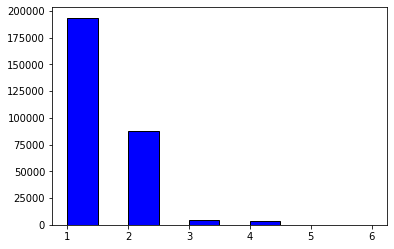

In [188]:
df_dupli_check.total.value_counts()

plt.hist(df_dupli_check.total.value_counts(), color = 'blue', edgecolor = 'black');

### 6.1 IDENTIFY WHO IS IN FRONT

In [118]:
def clean_ssm(file_name):

    df_ssm = pd.read_csv(file_name, index_col=0)

    df_ssm[["x_egoVelo", "y_egoVelo"]] = df_ssm['egoVelocity'].str.split( ',', expand=True)
    df_ssm[["x_foeVelo", "y_foeVelo"]] = df_ssm['foeVelocity'].str.split( ',', expand=True)

    df_ssm[["x_egoPos", "y_egoPos"]] = df_ssm['egoPosition'].str.split( ',', expand=True)
    df_ssm[["x_foePos", "y_foePos"]] = df_ssm['foePosition'].str.split( ',', expand=True)

    df_ssm[["x_egoPos", "y_egoPos", "x_foePos", "y_foePos", "x_egoVelo", "y_egoVelo", "x_foeVelo", "y_foeVelo", 'typeSpan', 'maxDRAC_value']] = df_ssm[["x_egoPos", "y_egoPos", "x_foePos", "y_foePos", "x_egoVelo", "y_egoVelo","x_foeVelo", "y_foeVelo",'typeSpan', 'maxDRAC_value']].astype("float")

    df_ssm["full_egoVelo"] = (df_ssm.x_egoVelo**2 +df_ssm.y_egoVelo**2)**(1/2)
    df_ssm["full_foeVelo"] = (df_ssm.x_foeVelo**2 +df_ssm.y_foeVelo**2)**(1/2)

    df_ssm["in_front"] = ''

    condition = [ (df_ssm.x_egoVelo*df_ssm.x_foeVelo >= 0) & (df_ssm.x_egoPos > df_ssm.x_foePos),
                  (df_ssm.x_egoVelo*df_ssm.x_foeVelo >= 0) & (df_ssm.x_egoPos <= df_ssm.x_foePos),
                  (df_ssm.y_egoVelo*df_ssm.y_foeVelo >= 0) & (df_ssm.y_egoPos > df_ssm.y_foePos),
                  (df_ssm.y_egoVelo*df_ssm.y_foeVelo >= 0) & (df_ssm.y_egoPos <= df_ssm.y_foePos)
                ]

    values = ["ego", "foe", "ego", "foe"]

    df_ssm["in_front"] = np.select(condition, values)

    return df_ssm

In [119]:
df_ssm = clean_ssm('LA_CS_ssm_csv.csv')
df_ssm.in_front.value_counts()

### 6.1 REAR-END DECEL

In [121]:
def red(df_red, maxDRAC, decel): 

    # Calculate the deceleration between two time spand 
    df_red["ego_decel"] = df_red.full_egoVelo.diff() 
    df_red["foe_decel"] = df_red.full_foeVelo.diff() 

    # Condition 1: same lane
    df_red = df_red[(df_red.foeLane == df_red.egoLane)]

    # Condition 2: no vehicle are stopped
    df_red = df_red[(df_red.egoVelocity != "0.00,0.00") & (df_red.foeVelocity != "0.00,0.00")] 
   
    # Condition 3: vehicle behind decelerating 
    df_red = df_red[((df_red.in_front == "ego" ) & (df_red.foe_decel < decel)) | ((df_red.in_front == "foe" ) & (df_red.ego_decel < decel))] 
    
    # Condition 4: Deceleration required to avoid contact high enough 
    df_red = df_red[ (df_red.maxDRAC_value > maxDRAC)]

    nb_precrash = df_red.conflict_number.nunique()

    return df_red, nb_precrash

In [122]:
df_red, nb_red = red(df_ssm, 1.0, -10)
df_red.in_front.value_counts()

In [ ]:
plt.hist(df_red.foe_decel[1:], bins = 100, color = 'blue', edgecolor = 'black');

### 6.2 REAR-END STOP

In [124]:
def res(df_res, maxDRAC):

    # Condition 1: same lane
    df_res = df_res[(df_res.foeLane == df_res.egoLane)]

    # Condition 2: Lead vehicle is stopped
    df_res = df_res[((df_res.in_front == "ego" ) & (df_res.egoVelocity == "0.00,0.00")) | ((df_res.in_front == "foe" ) & (df_res.foeVelocity == "0.00,0.00"))] 

    # Condition 4: Deceleration required to avoid contact high enough 
    df_res = df_res[(df_res.maxDRAC_value > maxDRAC)]

    nb_precrash = df_res.conflict_number.nunique()

    return df_res, nb_precrash

In [132]:
df_res, nb_res = res(df_ssm, 2.0)
nb_res

In [ ]:
plt.hist(df_res.maxDRAC_value, bins = 100, color = 'blue', edgecolor = 'black');

### 6.3 LANE CHANGING 

# 7. FINAL PLOT

In [140]:
def plot_res_red(type, decel):
    nb_precrash = []
    drac = []
    perfect_range = [x * 0.2 for x in range(0, 30)]

    for i in perfect_range: 
        if type == "res":
            df_res, nb = res(df_ssm, i)
      
        elif type == "red":
            df_red, nb = red(df_ssm, i, decel)

        nb_precrash.append(nb)
        drac.append(i)
    
    return drac, nb_precrash

In [ ]:
#RES
x, y = plot_res_red("res", 0)
plt.plot(x,y)    

In [ ]:
#RED
import matplotlib.pyplot as plt

fig, axs = plt.subplots(nrows=8,  figsize=(10, 30), sharey=True)
axs = axs.ravel()

decel = [-1, -2, -5, -10, -20, -30, -40 ]

for idx, i in enumerate(decel):

    x, y = plot_res_red("red", i)
    print(i)
    if idx != 0:
        axs[idx].plot(x, y)
        #axs[idx].ylabel(" # Pre-crash observed, decel = "+ str(i))
    else: 
        axs[idx].plot(x, y)
        axs[idx].set_title("Deceleration required to avoid contact (DRAC)")

-1
-2
-5
-10
-20
-30
-40


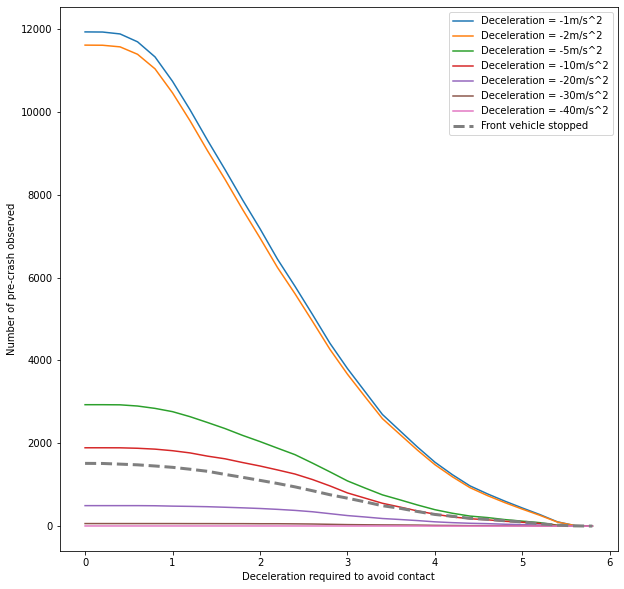

In [160]:
#RED & RES
plt.figure(figsize=(10,10))

decel = [-1, -2, -5, -10, -20, -30, -40 ]

for idx, i in enumerate(decel):
    x_red, y_red = plot_res_red("red", i)
    print(i)
    
    label = 'Deceleration = ' + str(i) + 'm/s^2'
    plt.plot(x_red, y_red, label = label)

# Add Rear end stopped
x_res, y_res = plot_res_red("res", 0)
plt.plot(x_res, y_res, label = "Front vehicle stopped", linewidth = 3, linestyle ='dashed')

plt.ylabel('Number of pre-crash observed')
plt.xlabel('Deceleration required to avoid contact')
plt.legend()
plt.show()

In [158]:
df_ssm.shape

(552886, 43)

# 8. Appendix

In [90]:
len(flow_dupli.VDS.unique())

7009

In [88]:
len(detectors_id)

10289

In [ ]:
POUBELLE

In [ ]:
def convertion_in_lon_lat(pems_path, lat_log_file, file_inductor):
    
    lat_log_path = pems_path + "/" + lat_log_file
    path_inductor = pems_path + "/" + file_inductor

    df_lat_log = pd.read_excel(lat_log_path)
    df_inductor = pd.read_excel(path_inductor)

    #Convertion
    list_lat = []
    list_log = []
    for row in range(df_inductor.shape[0]):
        #FIND INDEX OF CLOSEST VALUE
        list_pm = df_lat_log['Abs PM'].tolist()
        indx = min(range(len(list_pm)), key=lambda i: abs(list_pm[i]-df_inductor['Abs PM'][row]))

        list_lat.append(df_lat_log.Latitude[indx])
        list_log.append(df_lat_log.Longitude[indx])

    #Add new columns
    df_inductor["lat"] = list_lat
    df_inductor["lon"] = list_log

    #Clean the file and save as an array
    df_inductor = df_inductor[["VDS", "lat", "lon"]]
    df_inductor_array = df_inductor.to_numpy()

    return df_inductor_array

In [ ]:
import xml.etree.ElementTree as ET

def read_ssm(file_name):
     # Read the file using ElementTree package
     tree = ET.parse(file_name)

     # getting the parent tag of the xml document
     root = tree.getroot()

     

     #Initiate the dataframe
     output = pd.DataFrame()
     conflict_number = []

     # Loop through conflict
     for idx, conflict in enumerate(root):
          full_dict = conflict.attrib
          
          # Loop through element of conflict
          for nested in conflict:
               
               conflict_number.append(idx)

               #Add a prefix to each dict: [minTTC, maxDRAC, PET_value]
               prefix = nested.tag + '_' 
               dict_nest = nested.attrib
               dict_prep = {prefix + str(key): val for key, val in dict_nest.items()}

               # Add the three subsection dict side by side
               full_dict.update(dict_prep)
               
               df_temp = pd.DataFrame([full_dict])


          output = pd.concat([output, df_temp], ignore_index=True)
     
     output['conflict_number'] = conflict_number

     return output